# Trajectory clustering

In this notebook:
<ol>
    <li> Introduction
        <ol>
        <li> 
        <li> 
        </ol>
    <li> Data reduction
    <li> Feature extraction
    <li> ML models
</ol>

## 1. Introduction

Clustering is one of the basic tool in working with trajectory data.

In the LiDAR dataset, it is a suitable approach as the data does not meet the accuracy needed for simple analysis through georeferencing. While lane-specific traffic flow may not be a possible (or at least straightforward) task, clustering can provide similar insights. Clustering trajectories would help analyse traffic flow based on streets and direction.

There are several benefits of this approach:
- **unsupervised**: there is no need to label data, which is a difficult and time-intensive task.
- **bottom-up**: the clusters do not need to match a predefined set, but rather reflect the specifics of the dataset.


Drawbacks include:
- **uncertain outcomes**: especially with noisy data. The LiDAR data is full of incomplete and/or noisy trajectories.
- **low granularity**: no distinction between lanes.

The following analysis works with trajectories as wholes, which makes clustering very prone to errors due to noise/incompleteness. It is, however, a simple approach worth of exploring. Partitioning trajectories into subtrajectories is a promising approach, which shall be explored next.


## 2. Data Reduction

In this analysis, data reduction happens through simple uniform sampling in batch mode. There are many and far more sophisticated approaches (filtering and line reduction algorithms like RDP), but they tend to be computationally expensive with complexity of more than O(n^2). Empirical experimentation shows that uniform sampling performs well on this dataset error-wise (using Hausdorff distance as a measure), and it outperforms all other approaches by a solid margin runtime-wise.

Here trajectory reduction is done in batch mode. To save memory space, data reduction and specifically uniform sampling can be implemented on-line, which is on top of the task agenda.

In [2]:
# Third party imports
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import shapely as shp
from shapely.geometry import LineString
from shapely.ops import unary_union
from sklearn_extra.cluster import KMedoids

# Local imports
import add_geometry_lines as agl

In [4]:
def uniform_sample(group, compression = 50):
    i = int(len(group)/compression)
    if i <= 1:
        return group
    return group.iloc[::i]

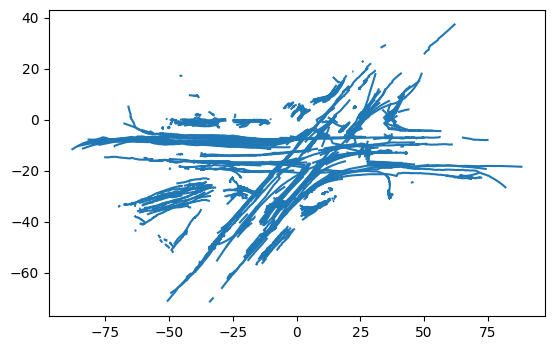

In [5]:
# Open the file as a pd.DataFrame
original_df = pd.read_csv("C:/Users/anape/Downloads/outsight/resources/0530-traj.csv")

# Drop unnecessary columns
original_df.drop('z',axis=1, inplace=True)

# Reduce & plot 
df = original_df.groupby("object_id").apply(uniform_sample, compression = 50)
df = df.reset_index(drop=True)
original_gdf = agl.add_geometry(original_df)
original_gdf.plot()
plt.show()

# Open the file as a pd.DataFrame
original_df_0109 = pd.read_csv("C:/Users/anape/Downloads/outsight/resources/0109-traj.csv")

# Drop unnecessary columns
original_df_0109.drop('zones',axis=1, inplace=True)
original_df_0109.drop('z',axis=1, inplace=True)
original_df_0109.drop('volume_m3',axis=1, inplace=True)
original_gdf_0109 = agl.add_geometry(original_df_0109)



## 3. Hausdorff distance k-medoids

This is a very straightforward approach. Similar to k-means, k-medoids clusters data based on a distance matrix. The key difference is that medoids are actual data points (in this case LineStrings) from the dataset. In the trajectories use case, this is more meaningful and interpretable than calculating a mean trajectory.

We define 'distance' between 2 trajectories as the Hausdorff distance. Calculating the distance matrix is computationally expensive, even though it is symmetric and we only need the upper triangle. That is still n²/2 hausdorff distances, n being the number of trajectories in the dataset.

In [6]:
# custom distance metric using Hausdorff distance
def hausdorff_distance(line1, line2):
    return line1.hausdorff_distance(line2)


def compressed_dist_matrix(filename, compression = 50):
    '''
    :param filename: path to csv file
    :param compression: compression as %, default = 50

    :return: distance_matrix as a list of list, object_ids list of ordered id's corresponding to matrix indices
        
    '''

    # load cvs file as df and compress
    df = pd.read_csv(filename)
    if 'zones' in df.columns:
        df.drop('zones', axis=1, inplace=True)

    df.drop('z', axis=1, inplace=True)

    if 'volume_m3' in df.columns:
        df.drop('volume_m3', axis=1, inplace=True)
    
    df.groupby("object_id").apply(uniform_sample, compression = compression)
    df = df.reset_index(drop=True)

    # turn into geodf
    gdf = agl.add_geometry(df)
    
    # since the gdf is indexed on object_id, get a list of them
    object_ids = gdf['object_id'].unique()

    # initializing n x n empty matrix
    n_trajectories = len(object_ids)
    distance_matrix = [[0 for _ in range(n_trajectories)] for _ in range(n_trajectories)]

    # Calculate distances and fill in the distance matrix
    for i in range(n_trajectories):
        for j in range(i, n_trajectories):  # matrix is symmetric, so upper triangle is enough
            # fetching LineStrings based on object_ids list
            line1 = gdf.loc[gdf['object_id'] == object_ids[i], 'geometry'].iloc[0]
            line2 = gdf.loc[gdf['object_id'] == object_ids[j], 'geometry'].iloc[0]
            
            distance = hausdorff_distance(line1, line2)
            distance_matrix[i][j] = distance
            distance_matrix[j][i] = distance

    return distance_matrix, object_ids

We run the function, then save the output variables to .npz file for easy retrieval.

In [ ]:
# dist_matrix, object_ids = compressed_dist_matrix("C:/Users/anape/Downloads/outsight/resources/0530-traj.csv")
# np.savez('0530_50comp_distance_matrix.npz', dist_matrix = dist_matrix, object_ids = object_ids)

dist_matrix, object_ids = compressed_dist_matrix("C:/Users/anape/Downloads/outsight/resources/0109-traj.csv", compression=80)
np.savez('0109_80comp_distance_matrix.npz', dist_matrix = dist_matrix, object_ids = object_ids)

A clustering function.

In [7]:
def cluster_medoids(npz_filename, gdf, n):
    '''
    :param npz_file: path to .npz file with dist_matrix and object_ids of the gdf
    :param gdf: geodataframe with LineStrings
    :param n: number of clusters

    Returns the gdf with cluster labels and the indices (object_id) of the medoids.
    '''
    curr_data = np.load(npz_filename)
    distance_matrix = curr_data['dist_matrix']
    object_ids = curr_data['object_ids']


    kmedoids = KMedoids(n_clusters=n, random_state=0)
    kmedoids.fit(distance_matrix)

    cluster_labels = kmedoids.labels_
    medoid_indices = kmedoids.medoid_indices_

    gdf['cluster'] = cluster_labels  # Assign cluster labels to GeoDataFrame

    medoids = []
    for i in medoid_indices:
        medoids.append(object_ids[i])

    return gdf, medoids

To evaluate the clustering, a combined exploratory function to cluster & plot the trajectories, colored by label.

In [9]:
def cluster_and_plot_medoids(npz_filename, gdf, compression):
    curr_data = np.load(npz_filename)
    distance_matrix = curr_data['dist_matrix']
    object_ids = curr_data['object_ids']

    rows = 3
    cols = 3
    fig, axes = plt.subplots(rows, cols, figsize=(15, 12))

    for n, ax in zip([2, 3, 5, 8, 10, 15, 20, 25, 30], axes.ravel()):
        kmedoids = KMedoids(n_clusters=n, random_state=0)
        kmedoids.fit(distance_matrix)

        cluster_labels = kmedoids.labels_
        medoid_indices = kmedoids.medoid_indices_

        gdf['cluster'] = cluster_labels  # Assign cluster labels to GeoDataFrame

        _, ax = plt.subplots(1,2)
        # Plot clusters
        gdf.plot(column='cluster', cmap='tab20', ax=ax[0])
        ax[0].set_title(f'{n} clusters')
        ax[0].set_yticks(())
        ax[0].set_xticks(())

        medoids = []
        for i in medoid_indices:
            medoids.append(object_ids[i])

        gdf[~gdf['object_id'].isin(medoids)].plot(color='lightgray', ax=ax[1])
        gdf[gdf['object_id'].isin(medoids)].plot(column='cluster', cmap='tab20', ax=ax[1])
        ax[1].set_title(f'cluster medoids')
        ax[1].set_yticks(())
        ax[1].set_xticks(())


    # Remove empty subplots
    for ax in axes.flat:
        if not ax.get_title():
            fig.delaxes(ax)

    fig.suptitle(f'K-Medoids clustering with n clusters on {compression}% reduced trajectories', fontsize=20)
    plt.subplots_adjust(hspace=0.1)
    plt.show()


## 3.1.1. K-medoids clustered data from 05.30.2023, with 50% compression.

<Figure size 1500x1200 with 0 Axes>

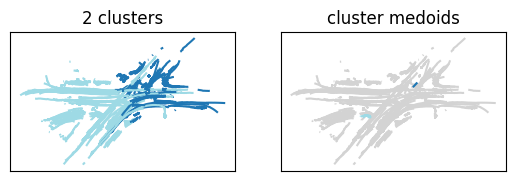

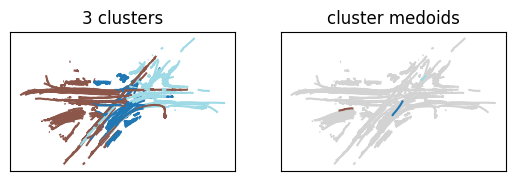

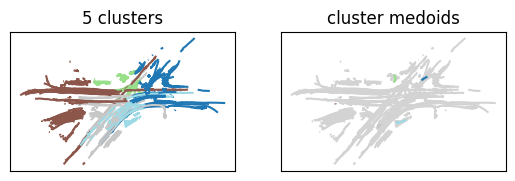

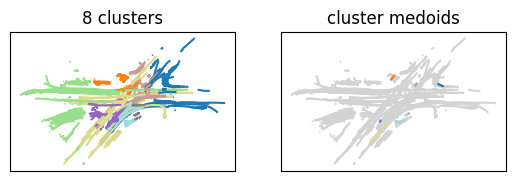

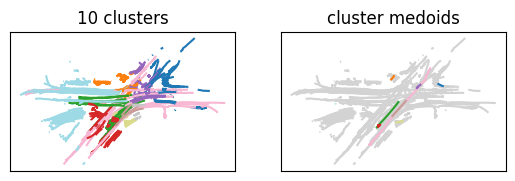

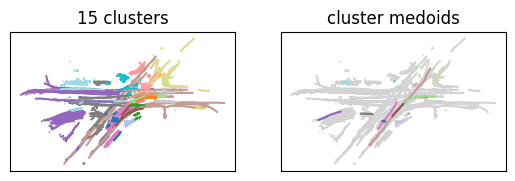

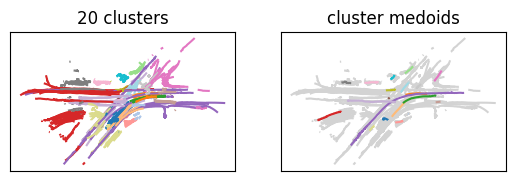

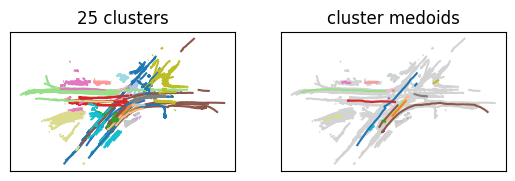

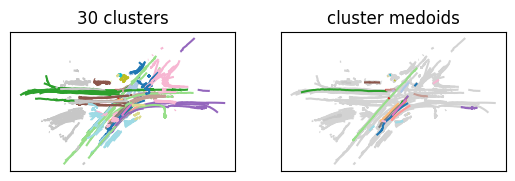

In [10]:
cluster_and_plot_medoids('0530_50comp_distance_matrix.npz', original_gdf, 50)

## 3.1.2. Visualizing on an interactive map

In [11]:
import folium
import pyproj
import random

In [12]:
# Transforming
source_crs_wkt = 'DERIVEDPROJCRS["",BASEPROJCRS["WGS 84 / Pseudo-Mercator",BASEGEOGCRS["WGS 84",ENSEMBLE["World Geodetic System 1984 ensemble",MEMBER["World Geodetic System 1984 (Transit)"],MEMBER["World Geodetic System 1984 (G730)"],MEMBER["World Geodetic System 1984 (G873)"],MEMBER["World Geodetic System 1984 (G1150)"],MEMBER["World Geodetic System 1984 (G1674)"],MEMBER["World Geodetic System 1984 (G1762)"],MEMBER["World Geodetic System 1984 (G2139)"],ELLIPSOID["WGS 84",6378137,298.257223563,LENGTHUNIT["metre",1]],ENSEMBLEACCURACY[2.0]],PRIMEM["Greenwich",0,ANGLEUNIT["degree",0.0174532925199433]],ID["EPSG",4326]],CONVERSION["Popular Visualisation Pseudo-Mercator",METHOD["Popular Visualisation Pseudo Mercator",ID["EPSG",1024]],PARAMETER["Latitude of natural origin",0,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8801]],PARAMETER["Longitude of natural origin",0,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8802]],PARAMETER["False easting",0,LENGTHUNIT["metre",1],ID["EPSG",8806]],PARAMETER["False northing",0,LENGTHUNIT["metre",1],ID["EPSG",8807]]]],DERIVINGCONVERSION["Affine",METHOD["Affine parametric transformation",ID["EPSG",9624]],PARAMETER["A0",-3716438.1093590977,LENGTHUNIT["metre",1],ID["EPSG",8623]],PARAMETER["A1",0.6158540384148486,SCALEUNIT["coefficient",1],ID["EPSG",8624]],PARAMETER["A2",0.40263073503547436,SCALEUNIT["coefficient",1],ID["EPSG",8625]],PARAMETER["B0",-2194507.2465994842,LENGTHUNIT["metre",1],ID["EPSG",8639]],PARAMETER["B1",-0.40263073503547436,SCALEUNIT["coefficient",1],ID["EPSG",8640]],PARAMETER["B2",0.6158540384148486,SCALEUNIT["coefficient",1],ID["EPSG",8641]]],CS[Cartesian,2],AXIS["easting (X)",east,ORDER[1],LENGTHUNIT["metre",1]],AXIS["northing (Y)",north,ORDER[2],LENGTHUNIT["metre",1]]]'
target_crs_wkt = 'EPSG:3857' 

transformer = pyproj.Transformer.from_crs(source_crs_wkt, target_crs_wkt, always_xy=True)

# Assuming you have an existing GeoDataFrame called 'original_gdf' with LineString geometries
# Make a copy of the original GeoDataFrame to preserve the original data
transformed_gdf = original_gdf.copy()

# Define a function to apply the transformation to each geometry
def transform_geometry(geometry):
    # Use the transformer to perform the coordinate transformation
    transformed_coords = transformer.transform(geometry.xy[0], geometry.xy[1])
    
    # Create a new LineString with the transformed coordinates
    return LineString(zip(*transformed_coords))

# Apply the transformation to the 'geometry' column of the GeoDataFrame
transformed_gdf['geometry'] = original_gdf['geometry'].apply(transform_geometry)


In [20]:
def plot_interactive(npz_filename, gdf, n):
    copy_gdf = gdf.copy(deep=True)

    cl_gdf, cl_med = cluster_medoids(npz_filename, copy_gdf, n)
    cl_gdf['geometry'] = cl_gdf['geometry'].apply(transform_geometry)

    # create a folium map
    map_clusters = folium.Map(location=[42.659395820532694, 23.3165594735582], zoom_start=50)

    # basemap layer
    folium.TileLayer(
        tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr='Esri',
        name='Esri Satellite',
        overlay=False,
        control=True
    ).add_to(map_clusters)

    grouped_clusters = cl_gdf.groupby('cluster')

    # Define a custom color palette for your 15 clusters
    color_palette = []
    for _ in range(n):
        color = "#{:02x}{:02x}{:02x}".format(random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
        color_palette.append(color)

    # Loop through the groups and add them as separate GeoJson layers with custom colors
    for i, (cluster, data) in enumerate(grouped_clusters):
        # Assign a custom color from the palette or use random color if more clusters than colors
        color = color_palette[i % len(color_palette)]
        
        geojson = folium.GeoJson(data, name=f'Cluster {cluster}', style_function=lambda x, color=color: {'color': color})
        geojson.add_to(map_clusters)

    # add a LayerControl to the map
    folium.LayerControl().add_to(map_clusters)

    display(map_clusters)

    return map_clusters



In [168]:
map_1 = plot_interactive('0530_50comp_distance_matrix.npz', original_gdf,15)

In [169]:
map_1.save('0530_cluster_folium_map.html')


Overall, pretty awful.

# 4. On filtered data

In [13]:
import pandas as pd
import geopandas as gpd
from add_geometry_points import add_geometry, locate
import math
import matplotlib.pyplot as plt
import numpy as np

In [14]:
zones = gpd.read_file("C:/Users/anape/Downloads/outsight/resources/QGIS/lanes_and_int.geojson")
gdf = add_geometry("C:/Users/anape/Downloads/outsight/resources/0109-traj.csv")
gdf = locate(gdf, "C:/Users/anape/Downloads/outsight/resources/QGIS/lanes_and_int.geojson")

# Drop unnecessary columns
gdf.drop('speed_kmh',axis=1, inplace=True)
gdf.drop('zones',axis=1, inplace=True)
gdf.drop('z',axis=1, inplace=True)
gdf.drop('volume_m3',axis=1, inplace=True)
gdf.drop('index_right',axis=1, inplace=True)

Filtering into complete, incomplete & pedestrian trajectories.

In [15]:
results = [] # to keep track of trajectory loc lists
results_ids = []
pedestrians = []
incomplete = []

for i,group in gdf.groupby('object_id'):
    locations = group['id'].tolist()
    m = (group['to_inter'].unique()).tolist()
    nan_count = np.sum(np.isnan(locations))
    total_count = len(locations)
    
    # If 75% or more time NaN location (pedestrian zones are NaN)
    if nan_count > total_count / 1.5:
        pedestrians.append(i)

    # If the object visits lanes that enter and leave the intersection
    elif 0 in m and 1 in m:
        k = (group['id'].unique()).tolist()
        
        # drop NaN values
        k = list(filter(lambda value: not math.isnan(value), k))
        if 0 in k and len(k) >= 3 and k[0] != 0 and k[-1] != 0:
            j = k.index(0)
            results.append([k[j-1],k[j+1],i])
            results_ids.append(i)

    # If not a complete trajectory
    else:
        incomplete.append(i)


# Split complete, pedestrians and incomplete
perfect_traj = gdf[gdf['object_id'].isin(results_ids)].set_index('object_id')
incomplete_traj = gdf[gdf['object_id'].isin(incomplete)].set_index('object_id')
pedestrian_traj = gdf[gdf['object_id'].isin(pedestrians)].set_index('object_id')

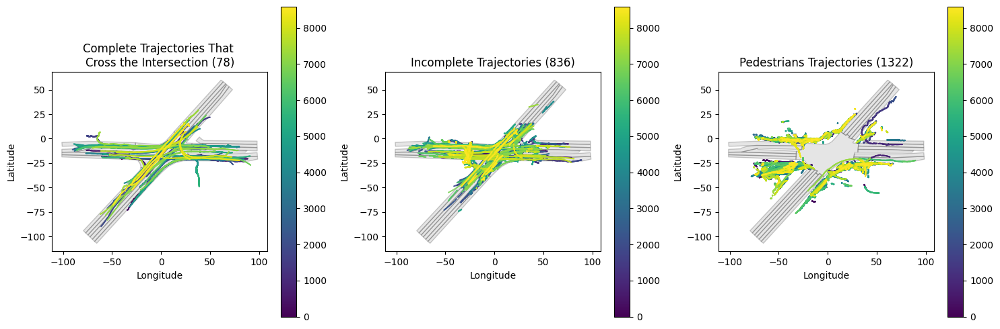

In [16]:
s1 = perfect_traj.groupby('object_id').ngroups
s2 = incomplete_traj.groupby('object_id').ngroups
s3 = pedestrian_traj.groupby('object_id').ngroups

s = [s1, s2, s3]
titles = [f'Complete Trajectories That \nCross the Intersection ({s1})', f'Incomplete Trajectories ({s2})', f'Pedestrians Trajectories ({s3})']
trajs = [perfect_traj, incomplete_traj, pedestrian_traj]



fix, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1x3 grid of subplots

for i in [0, 1, 2]:
    ax = axes[i] 
    zones.plot(color='gray', alpha=0.2, edgecolor='black', ax=ax)
    trajs[i].plot(marker='.', markersize=1, column='frame_number', cmap='viridis', legend=True, ax=ax)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(titles[i])

plt.tight_layout()
plt.show()

Converting into gdf with LineStrings.

In [17]:
perfect_traj_gdf = gpd.GeoDataFrame(geometry=gpd.GeoSeries())

# Group objects by object_id. LineString needs at least 2 points -> drop all object that appear only once
for i, group in perfect_traj.groupby('object_id'):
    if len(group) > 1:
        geometry = LineString([xy for xy in zip(group.x, group.y)])
        perfect_traj_gdf.loc[i,'geometry'] = geometry
        perfect_traj_gdf.loc[i,'object_id'] = i

# Set CRS that is the same as the CRS of the zones file. (NOTE: this may not be the real CRS of the trajectories)       
perfect_traj_gdf.crs = 'EPSG:3857'

In [117]:
pedestrian_traj_gdf = gpd.GeoDataFrame(geometry=gpd.GeoSeries())

# Group objects by object_id. LineString needs at least 2 points -> drop all object that appear only once
for i, group in pedestrian_traj.groupby('object_id'):
    if len(group) > 1:
        geometry = LineString([xy for xy in zip(group.x, group.y)])
        pedestrian_traj_gdf.loc[i,'geometry'] = geometry
        pedestrian_traj_gdf.loc[i,'object_id'] = i

# Set CRS that is the same as the CRS of the zones file. (NOTE: this may not be the real CRS of the trajectories)       
pedestrian_traj_gdf.crs = 'EPSG:3857'

Slighty altering the distance matrix function to match the new data.

In [18]:
def compressed_dist_matrix(gdf, compression = 50):

    object_ids = gdf['object_id'].unique()

    # initializing n x n empty matrix
    n_trajectories = len(object_ids)
    distance_matrix = [[0 for _ in range(n_trajectories)] for _ in range(n_trajectories)]

    # Calculate distances and fill in the distance matrix
    for i in range(n_trajectories):
        for j in range(i, n_trajectories):  # matrix is symmetric, so upper triangle is enough
            # fetching LineStrings based on object_ids list
            line1 = gdf.loc[gdf['object_id'] == object_ids[i], 'geometry'].iloc[0]
            line2 = gdf.loc[gdf['object_id'] == object_ids[j], 'geometry'].iloc[0]
            
            distance = hausdorff_distance(line1, line2)
            distance_matrix[i][j] = distance
            distance_matrix[j][i] = distance

    return distance_matrix, object_ids

Calculating the distance matrices and saving them into npz files for easy retrieval

In [27]:
# complete trajectories
dist_matrix, object_ids = compressed_dist_matrix(perfect_traj_gdf)
np.savez('0109_perftraj_distance_matrix.npz', dist_matrix = dist_matrix, object_ids = object_ids)

c:\Users\anape\Downloads\outsight\venv\Lib\site-packages\shapely\measurement.py:224: RuntimeWarning: invalid value encountered in hausdorff_distance
  return lib.hausdorff_distance(a, b, **kwargs)


In [47]:
# pedestrian trajectories

dist_matrix, object_ids = compressed_dist_matrix(pedestrian_traj_gdf)
np.savez('0109_pedestriantraj_distance_matrix.npz', dist_matrix = dist_matrix, object_ids = object_ids)

c:\Users\anape\Downloads\outsight\venv\Lib\site-packages\shapely\measurement.py:224: RuntimeWarning: invalid value encountered in hausdorff_distance
  return lib.hausdorff_distance(a, b, **kwargs)


Slightly altering the cluster & plot function to match the data.

In [43]:
def cluster_and_plot_filtered(npz_filename, gdf, compression):
    curr_data = np.load(npz_filename)
    distance_matrix = curr_data['dist_matrix']
    object_ids = curr_data['object_ids']

    rows = 3
    cols = 3
    fig, axes = plt.subplots(rows, cols, figsize=(15, 12))

    cmap = plt.get_cmap('tab20b')  # Use a consistent colormap


    for n, ax in zip([2, 3, 5, 8, 10, 12, 15, 20], axes.ravel()):
        kmedoids = KMedoids(n_clusters=n, random_state=0)
        kmedoids.fit(distance_matrix)

        cluster_labels = kmedoids.labels_
        medoid_indices = kmedoids.medoid_indices_

        gdf['cluster'] = cluster_labels  # Assign cluster labels to GeoDataFrame

        _, ax = plt.subplots(1,2)
        # Plot clusters
        gdf.plot(column='cluster', cmap=cmap, ax=ax[0])
        ax[0].set_title(f'{n} clusters')
        ax[0].set_yticks(())
        ax[0].set_xticks(())

        medoids = []
        for i in medoid_indices:
            medoids.append(object_ids[i])

        gdf[~gdf['object_id'].isin(medoids)].plot(color='lightgray', ax=ax[1])
        gdf[gdf['object_id'].isin(medoids)].plot(column='cluster', cmap=cmap, ax=ax[1])
        ax[1].set_title(f'cluster medoids')
        ax[1].set_yticks(())
        ax[1].set_xticks(())


    # Remove empty subplots
    for ax in axes.flat:
        if not ax.get_title():
            fig.delaxes(ax)

    fig.suptitle(f'K-Medoids clustering with n clusters on {compression}% reduced trajectories', fontsize=20)
    plt.subplots_adjust(hspace=0.1)
    plt.show()


## 4.1.1. Clustering complete trajectories

<Figure size 1500x1200 with 0 Axes>

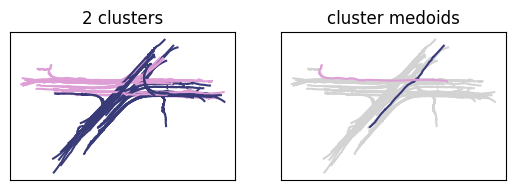

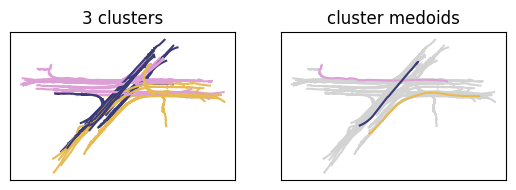

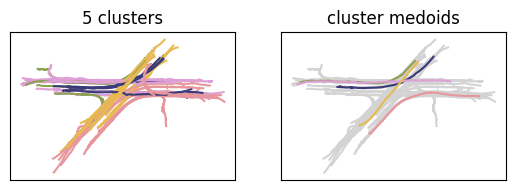

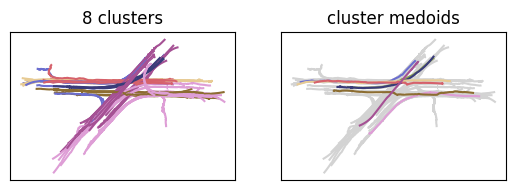

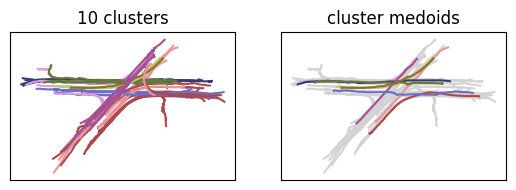

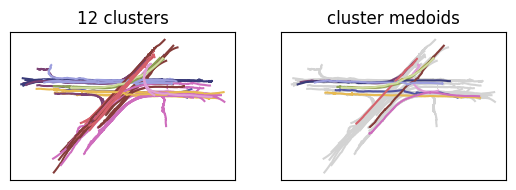

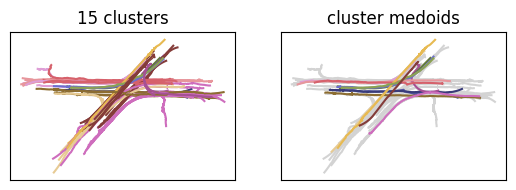

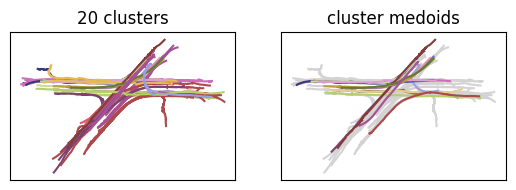

In [118]:
cluster_and_plot_filtered('0109_perftraj_distance_matrix.npz', perfect_traj_gdf, 0)

## 4.1.2. Interactive complete trajectories

In [21]:
map_2 = plot_interactive('0109_perftraj_distance_matrix.npz', perfect_traj_gdf,12)

In [22]:
map_2.save('0109_complete_12_cluster_folium_map.html')


## 4.2.1. Clustering pedestrian trajectories

c:\Users\anape\Downloads\outsight\venv\Lib\site-packages\sklearn\utils\extmath.py:193: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
c:\Users\anape\Downloads\outsight\venv\Lib\site-packages\sklearn\utils\extmath.py:193: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
c:\Users\anape\Downloads\outsight\venv\Lib\site-packages\sklearn\utils\extmath.py:193: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
c:\Users\anape\Downloads\outsight\venv\Lib\site-packages\sklearn\utils\extmath.py:193: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
c:\Users\anape\Downloads\outsight\venv\Lib\site-packages\sklearn\utils\extmath.py:193: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
c:\Users\anape\Downloads\outsight\venv\Lib\site-packages\sklearn\utils\extmath.py:193: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
c:\Users\anape\Downloads\outsight\venv\Lib\site-packages\sklearn\utils\extmath.py:

<Figure size 1500x1200 with 0 Axes>

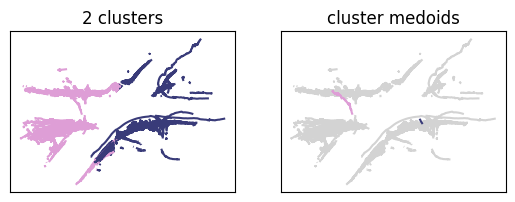

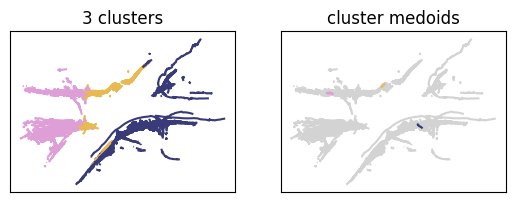

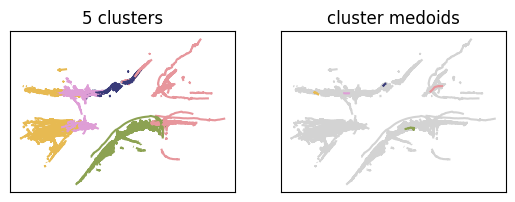

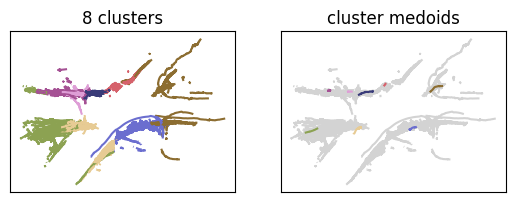

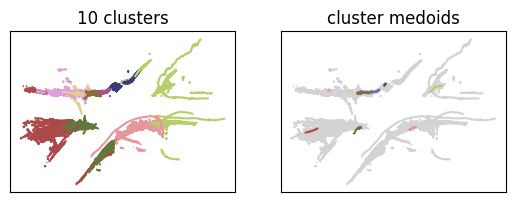

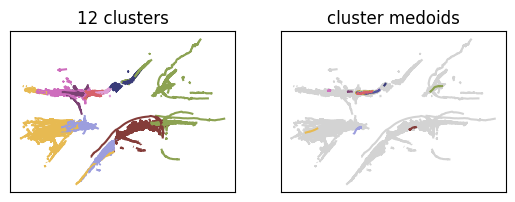

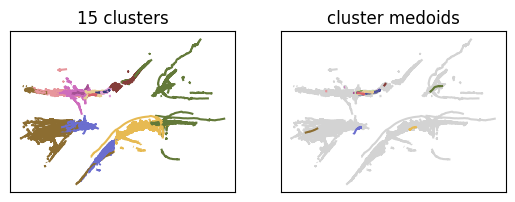

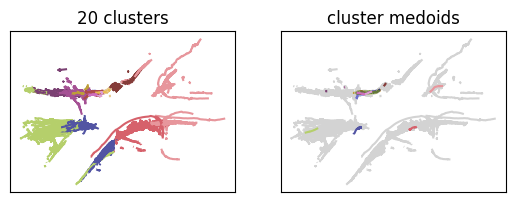

In [48]:
cluster_and_plot_filtered('0109_pedestriantraj_distance_matrix.npz', pedestrian_traj_gdf, 0)

## 4.1.2. Interactive pedestrian trajectories

In [181]:
map_3 = plot_interactive('0109_pedestriantraj_distance_matrix.npz', pedestrian_traj_gdf,7)

c:\Users\anape\Downloads\outsight\venv\Lib\site-packages\sklearn\utils\extmath.py:193: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b


In [182]:
map_3.save('0109_pedestrian_cluster_folium_map.html')
